## 0. Goal
Vary the sliding window duration <br>
Differ from v5: add more comaprison between different sliding window sizes, not only compare v4 and v5: 
1. Paired UMAP: v4 vs v5; v1 vs v7
2. One UMAP for all call types

In [1]:
import os, sys, importlib, librosa, glob, h5py, tqdm, pickle, gc
from scipy.io import wavfile
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from joblib import Parallel, delayed
import random
import umap, hdbscan
from collections import Counter, OrderedDict
import seaborn as sns
from torch.utils.data import Dataset, DataLoader, TensorDataset
import torch
from matplotlib.colors import ListedColormap
from matplotlib.patches import Patch
from skimage import transform
import gc
import colorsys
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import NearestNeighbors

plt.rcParams['pdf.fonttype'] = 42 

In [2]:
# import my utility script
cluster_script_path = '/home/zz367/ProjectsU/EphysMONAO/Jupyter/MatlabCodes/ZZ_callClustering/'
sys.path.insert(1, cluster_script_path)
import vae_goffinet, hopkins
importlib.reload(vae_goffinet)

<module 'vae_goffinet' from '/home/zz367/ProjectsU/EphysMONAO/Jupyter/MatlabCodes/ZZ_callClustering/vae_goffinet.py'>

In [3]:
# create a custom colormap for spectrogram
jet = plt.get_cmap('jet', 255)
# Extract jet colors and prepend black at the beginning
jet_colors = jet(np.linspace(0, 1, 255))
custom_colors = np.vstack([[0, 0, 0, 1], jet_colors])  # Black for 0, then jet
custom_cmap = ListedColormap(custom_colors)

## 1. Inputs

In [4]:
fd_z4 = '/mnt/z4'
fd_data = os.path.join(fd_z4, 'zz367', 'EphysMONAO', 'Analyzed', 'vaeWav')
birdID = 'pair5RigCCU29'
# color limits when calculating spectrograms, depending on the audio amplitude, may differ between birds
clims = [1.5,7]
# what syllable pairs to analyze
v_all = [f'v{vi}' for vi in range(8)]
print(v_all)
v_pairs = [['v4', 'v5'], ['v1', 'v7']]
# what spectogram datasets to use
spec_suffix = 'Spectrogram2'
spec_run = 'spec_goffinet_traj_256_236'
# what VAE run to use
vae_suffix = 'VAE5'
# vae_run = 'traj_chop_32_1_32'
# fd_vae = os.path.join(fd_data, birdID, 'Traj', vae_suffix, vae_run)
# where the VAE latents results are saved
apply_suffix = 'applySyl5'
# apply_run = f'latent.{vae_run}'
# fd_latent = os.path.join(fd_data, birdID, 'Traj', apply_suffix, apply_run)
# print(fd_latent)

['v0', 'v1', 'v2', 'v3', 'v4', 'v5', 'v6', 'v7']


In [5]:
# where to save results
fd_save_base = os.path.join(fd_data, birdID, 'Traj', apply_suffix, 'paramSearch5_r2')
print(fd_save_base)

/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2


In [6]:
# grab the info on syllales
fd_latent_base = os.path.join(fd_data, birdID, 'Traj', apply_suffix)
fn_merged = os.path.join(fd_latent_base, f'{birdID}.info_merged.csv')
info_syl = pd.read_csv(fn_merged, index_col=0)
# construct a unique syllable id
info_syl['syl_id'] = [f'{info_syl["fn_wav"][ii]}_{info_syl["s_idx"][ii]}' for ii in info_syl.index]
info_syl = info_syl.reset_index()  # reset index for easy merging later

In [7]:
param_umap = {'n_components':2, 'n_neighbors':25, 'min_dist':0, 'metric':'euclidean'}

## 2. UMAP on latents

In [8]:
# loop through different sliding window width
win_list =  [16,   24,  32,  40,  48,  64, 80]

/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_24_1_24
v1: Total syllable 3798. Pass threshold 2662. Sampled 1000
(206897, 32) (206897, 21)
v2: Total syllable 1658. Pass threshold 1443. Sampled 1000
(174653, 32) (174653, 21)
v3: Total syllable 1796. Pass threshold 1362. Sampled 1000
(122019, 32) (122019, 21)
v4: Total syllable 2421. Pass threshold 1228. Sampled 1000
(197759, 32) (197759, 21)
v5: Total syllable 1519. Pass threshold 1359. Sampled 1000
(195478, 32) (195478, 21)
v6: Total syllable 6658. Pass threshold 1742. Sampled 1000
(188043, 32) (188043, 21)
v7: Total syllable 3102. Pass threshold 2094. Sampled 1000
(176981, 32) (176981, 21)
(1261830, 32) (1261830, 21)
(393237, 32) (393237, 21)
UMAP(min_dist=0, n_jobs=1, n_neighbors=25, random_state=1118, verbose=True)
Thu Jul 31 19:47:22 2025 Construct fuzzy simplicial set
Thu Jul 31 19:47:22 2025 Finding Nearest Neighbors
Thu Jul 31 19:47:22 2025 Building RP forest with 36 trees


/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 19:47:28 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	 3  /  19
	Stopping threshold met -- exiting after 3 iterations
Thu Jul 31 19:47:53 2025 Finished Nearest Neighbor Search
Thu Jul 31 19:47:57 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 19:52:03 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_24_1_24/pair5RigCCU29.paired.v4v5.embedding.csv
Thu Jul 31 19:52:53 2025 Worst tree score: 0.84614876
Thu Jul 31 19:52:53 2025 Mean tree score: 0.84797703
Thu Jul 31 19:52:53 2025 Best tree score: 0.84982847
Thu Jul 31 19:52:56 2025 Forward diversification reduced edges from 9830925 to 2458959
Thu Jul 31 19:52:58 2025 Reverse diversification reduced edges from 2458959 to 2458959
Thu Jul 31 19:52:59 2025 Degree pruning reduced edges from 2646220 to 2646220
Thu Jul 31 19:52:59 2025 Resorting data and graph based on tree order
Thu Jul 31 19:53:00 2025 B

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 19:54:19 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	 3  /  19
	Stopping threshold met -- exiting after 3 iterations
Thu Jul 31 19:54:38 2025 Finished Nearest Neighbor Search
Thu Jul 31 19:54:40 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 19:58:27 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_24_1_24/pair5RigCCU29.paired.v1v7.embedding.csv
Thu Jul 31 19:59:16 2025 Worst tree score: 0.83603645
Thu Jul 31 19:59:16 2025 Mean tree score: 0.83841734
Thu Jul 31 19:59:16 2025 Best tree score: 0.84168668
Thu Jul 31 19:59:17 2025 Forward diversification reduced edges from 9596950 to 2321522
Thu Jul 31 19:59:17 2025 Reverse diversification reduced edges from 2321522 to 2321522
Thu Jul 31 19:59:17 2025 Degree pruning reduced edges from 2493622 to 2493622
Thu Jul 31 19:59:17 2025 Resorting data and graph based on tree order
Thu Jul 31 19:59:17 2025 B

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 20:00:32 2025 Finding Nearest Neighbors
Thu Jul 31 20:00:32 2025 Building RP forest with 61 trees
Thu Jul 31 20:00:56 2025 NN descent for 20 iterations
	 1  /  20
	 2  /  20
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 20:02:03 2025 Finished Nearest Neighbor Search
Thu Jul 31 20:02:11 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs


IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out
IOStream.flush timed out


Thu Jul 31 20:23:02 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_24_1_24/pair5RigCCU29.all.v0v1v2v3v4v5v6v7.embedding.csv
Thu Jul 31 20:26:06 2025 Worst tree score: 0.79558102
Thu Jul 31 20:26:06 2025 Mean tree score: 0.79841912
Thu Jul 31 20:26:06 2025 Best tree score: 0.80060943
Thu Jul 31 20:26:11 2025 Forward diversification reduced edges from 31545750 to 8053121
Thu Jul 31 20:26:11 2025 Reverse diversification reduced edges from 8053121 to 8053121
Thu Jul 31 20:26:12 2025 Degree pruning reduced edges from 8790554 to 8790554
Thu Jul 31 20:26:12 2025 Resorting data and graph based on tree order
Thu Jul 31 20:26:12 2025 Building and compiling search function
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_32_1_32
v1: Total syllable 3798. Pass threshold 2662. Sampled 1000
(214897, 32) (214897, 21)
v2: Total syllable 1658. Pass threshold 1443. Sampled 1000
(182653,

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 20:35:09 2025 Construct fuzzy simplicial set
Thu Jul 31 20:35:09 2025 Finding Nearest Neighbors
Thu Jul 31 20:35:09 2025 Building RP forest with 37 trees
Thu Jul 31 20:35:13 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 20:35:30 2025 Finished Nearest Neighbor Search
Thu Jul 31 20:35:33 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 20:39:43 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_32_1_32/pair5RigCCU29.paired.v4v5.embedding.csv
Thu Jul 31 20:40:35 2025 Worst tree score: 0.87387993
Thu Jul 31 20:40:35 2025 Mean tree score: 0.87534719
Thu Jul 31 20:40:35 2025 Best tree score: 0.87705168
Thu Jul 31 20:40:36 2025 Forward diversification reduced edges from 10230925 to 2556828
Thu Jul 31 20:40:37 2025 Reverse diversification reduced edges from 2556828 to 2556828
Thu Jul 31 20:40:37 2025 Degree pruning reduced edges from 2725280 to 2725280
Thu Jul 31 20:40:37 2025 Resorting data and graph based on tree order
Thu Jul 31 20:40:37 2025 

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 20:41:59 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 20:42:16 2025 Finished Nearest Neighbor Search
Thu Jul 31 20:42:18 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 20:45:57 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_32_1_32/pair5RigCCU29.paired.v1v7.embedding.csv
Thu Jul 31 20:46:48 2025 Worst tree score: 0.86567153
Thu Jul 31 20:46:48 2025 Mean tree score: 0.86757671
Thu Jul 31 20:46:48 2025 Best tree score: 0.87024292
Thu Jul 31 20:46:49 2025 Forward diversification reduced edges from 9996950 to 2397300
Thu Jul 31 20:46:49 2025 Reverse diversification reduced edges from 2397300 to 2397300
Thu Jul 31 20:46:49 2025 Degree pruning reduced edges from 2548454 to 2548454
Thu Jul 31 20:46:49 2025 Resorting data and graph based on tree order
Thu Jul 31 20:46:49 2025 B

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 20:48:05 2025 Finding Nearest Neighbors
Thu Jul 31 20:48:05 2025 Building RP forest with 62 trees
Thu Jul 31 20:48:29 2025 NN descent for 20 iterations
	 1  /  20
	 2  /  20
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 20:49:40 2025 Finished Nearest Neighbor Search
Thu Jul 31 20:49:50 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 21:22:28 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_32_1_32/pair5RigCCU29.all.v0v1v2v3v4v5v6v7.embedding.csv
Thu Jul 31 21:25:45 2025 Worst tree score: 0.83395354
Thu Jul 31 21:25:45 2025 Mean tree score: 0.83591518
Thu Jul 31 21:25:45 2025 Best tree score: 0.83767557
Thu Jul 31 21:25:50 2025 Forward diversification reduced edges from 32945750 to 8292862
Thu Jul 31 21:25:51 2025 Reverse diversification reduced edges from 8292862 to 8292862
Thu Jul 31 21:25:51 2025 Degree pruning reduced edges from 8942382 to 8942382
Thu Jul 31 21:25:51 2025 Resorting data and graph based on tree order
Thu Jul 31 21:25

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 21:35:14 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 21:35:32 2025 Finished Nearest Neighbor Search
Thu Jul 31 21:35:34 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 21:40:01 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_40_1_40/pair5RigCCU29.paired.v4v5.embedding.csv
Thu Jul 31 21:40:57 2025 Worst tree score: 0.88072063
Thu Jul 31 21:40:57 2025 Mean tree score: 0.88278666
Thu Jul 31 21:40:57 2025 Best tree score: 0.88499590
Thu Jul 31 21:40:58 2025 Forward diversification reduced edges from 10630925 to 2643823
Thu Jul 31 21:40:58 2025 Reverse diversification reduced edges from 2643823 to 2643823
Thu Jul 31 21:40:58 2025 Degree pruning reduced edges from 2814610 to 2814610
Thu Jul 31 21:40:58 2025 Resorting data and graph based on tree order
Thu Jul 31 21:40:58 2025 

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 21:42:20 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 21:42:37 2025 Finished Nearest Neighbor Search
Thu Jul 31 21:42:40 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 21:46:51 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_40_1_40/pair5RigCCU29.paired.v1v7.embedding.csv
Thu Jul 31 21:47:44 2025 Worst tree score: 0.87627381
Thu Jul 31 21:47:44 2025 Mean tree score: 0.87801412
Thu Jul 31 21:47:44 2025 Best tree score: 0.87938771
Thu Jul 31 21:47:45 2025 Forward diversification reduced edges from 10396950 to 2458330
Thu Jul 31 21:47:45 2025 Reverse diversification reduced edges from 2458330 to 2458330
Thu Jul 31 21:47:45 2025 Degree pruning reduced edges from 2606502 to 2606502
Thu Jul 31 21:47:45 2025 Resorting data and graph based on tree order
Thu Jul 31 21:47:45 2025 

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 21:49:07 2025 Finding Nearest Neighbors
Thu Jul 31 21:49:07 2025 Building RP forest with 64 trees
Thu Jul 31 21:49:31 2025 NN descent for 20 iterations
	 1  /  20
	 2  /  20
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 21:50:44 2025 Finished Nearest Neighbor Search
Thu Jul 31 21:50:52 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 22:20:56 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_40_1_40/pair5RigCCU29.all.v0v1v2v3v4v5v6v7.embedding.csv
Thu Jul 31 22:24:26 2025 Worst tree score: 0.84769877
Thu Jul 31 22:24:26 2025 Mean tree score: 0.84939999
Thu Jul 31 22:24:26 2025 Best tree score: 0.85122613
Thu Jul 31 22:24:31 2025 Forward diversification reduced edges from 34345750 to 8459293
Thu Jul 31 22:24:32 2025 Reverse diversification reduced edges from 8459293 to 8459292
Thu Jul 31 22:24:32 2025 Degree pruning reduced edges from 9076492 to 9076492
Thu Jul 31 22:24:32 2025 Resorting data and graph based on tree order
Thu Jul 31 22:24

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 22:34:11 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 22:34:29 2025 Finished Nearest Neighbor Search
Thu Jul 31 22:34:32 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 22:39:45 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_48_1_48/pair5RigCCU29.paired.v4v5.embedding.csv
Thu Jul 31 22:40:43 2025 Worst tree score: 0.87844628
Thu Jul 31 22:40:43 2025 Mean tree score: 0.88014205
Thu Jul 31 22:40:43 2025 Best tree score: 0.88215177
Thu Jul 31 22:40:45 2025 Forward diversification reduced edges from 11030925 to 2669216
Thu Jul 31 22:40:45 2025 Reverse diversification reduced edges from 2669216 to 2669216
Thu Jul 31 22:40:45 2025 Degree pruning reduced edges from 2846778 to 2846778
Thu Jul 31 22:40:45 2025 Resorting data and graph based on tree order
Thu Jul 31 22:40:45 2025 

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 22:42:10 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 22:42:28 2025 Finished Nearest Neighbor Search
Thu Jul 31 22:42:30 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 22:47:23 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_48_1_48/pair5RigCCU29.paired.v1v7.embedding.csv
Thu Jul 31 22:48:20 2025 Worst tree score: 0.87521708
Thu Jul 31 22:48:20 2025 Mean tree score: 0.87703837
Thu Jul 31 22:48:20 2025 Best tree score: 0.87863471
Thu Jul 31 22:48:21 2025 Forward diversification reduced edges from 10796950 to 2490842
Thu Jul 31 22:48:21 2025 Reverse diversification reduced edges from 2490842 to 2490842
Thu Jul 31 22:48:21 2025 Degree pruning reduced edges from 2641636 to 2641636
Thu Jul 31 22:48:21 2025 Resorting data and graph based on tree order
Thu Jul 31 22:48:21 2025 

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 22:49:41 2025 Finding Nearest Neighbors
Thu Jul 31 22:49:41 2025 Building RP forest with 64 trees
Thu Jul 31 22:50:07 2025 NN descent for 20 iterations
	 1  /  20
	 2  /  20
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 22:51:22 2025 Finished Nearest Neighbor Search
Thu Jul 31 22:51:30 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 23:24:04 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_48_1_48/pair5RigCCU29.all.v0v1v2v3v4v5v6v7.embedding.csv
Thu Jul 31 23:27:43 2025 Worst tree score: 0.84652301
Thu Jul 31 23:27:43 2025 Mean tree score: 0.84857643
Thu Jul 31 23:27:43 2025 Best tree score: 0.85086549
Thu Jul 31 23:27:48 2025 Forward diversification reduced edges from 35745750 to 8503908
Thu Jul 31 23:27:49 2025 Reverse diversification reduced edges from 8503908 to 8503908
Thu Jul 31 23:27:49 2025 Degree pruning reduced edges from 9124822 to 9124822
Thu Jul 31 23:27:49 2025 Resorting data and graph based on tree order
Thu Jul 31 23:27

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 23:37:54 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 23:38:14 2025 Finished Nearest Neighbor Search
Thu Jul 31 23:38:17 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 23:43:33 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_64_1_64/pair5RigCCU29.paired.v4v5.embedding.csv
Thu Jul 31 23:44:36 2025 Worst tree score: 0.87546832
Thu Jul 31 23:44:36 2025 Mean tree score: 0.87753829
Thu Jul 31 23:44:36 2025 Best tree score: 0.87943673
Thu Jul 31 23:44:37 2025 Forward diversification reduced edges from 11830925 to 2775901
Thu Jul 31 23:44:38 2025 Reverse diversification reduced edges from 2775901 to 2775901
Thu Jul 31 23:44:38 2025 Degree pruning reduced edges from 2958722 to 2958722
Thu Jul 31 23:44:38 2025 Resorting data and graph based on tree order
Thu Jul 31 23:44:38 2025 

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 23:46:07 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 23:46:26 2025 Finished Nearest Neighbor Search
Thu Jul 31 23:46:29 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Thu Jul 31 23:51:22 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_64_1_64/pair5RigCCU29.paired.v1v7.embedding.csv
Thu Jul 31 23:52:24 2025 Worst tree score: 0.87336325
Thu Jul 31 23:52:24 2025 Mean tree score: 0.87472380
Thu Jul 31 23:52:24 2025 Best tree score: 0.87648045
Thu Jul 31 23:52:25 2025 Forward diversification reduced edges from 11596950 to 2614560
Thu Jul 31 23:52:25 2025 Reverse diversification reduced edges from 2614560 to 2614560
Thu Jul 31 23:52:25 2025 Degree pruning reduced edges from 2769210 to 2769210
Thu Jul 31 23:52:25 2025 Resorting data and graph based on tree order
Thu Jul 31 23:52:25 2025 

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Thu Jul 31 23:53:50 2025 Finding Nearest Neighbors
Thu Jul 31 23:53:50 2025 Building RP forest with 64 trees
Thu Jul 31 23:54:18 2025 NN descent for 21 iterations
	 1  /  21
	 2  /  21
	Stopping threshold met -- exiting after 2 iterations
Thu Jul 31 23:55:38 2025 Finished Nearest Neighbor Search
Thu Jul 31 23:55:47 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Fri Aug  1 00:28:56 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_64_1_64/pair5RigCCU29.all.v0v1v2v3v4v5v6v7.embedding.csv
Fri Aug  1 00:32:56 2025 Worst tree score: 0.84693643
Fri Aug  1 00:32:56 2025 Mean tree score: 0.84929128
Fri Aug  1 00:32:56 2025 Best tree score: 0.85078381
Fri Aug  1 00:33:02 2025 Forward diversification reduced edges from 38545750 to 8861712
Fri Aug  1 00:33:02 2025 Reverse diversification reduced edges from 8861712 to 8861712
Fri Aug  1 00:33:03 2025 Degree pruning reduced edges from 9471510 to 9471510
Fri Aug  1 00:33:03 2025 Resorting data and graph based on tree order
Fri Aug  1 00:33

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Fri Aug  1 00:43:56 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Fri Aug  1 00:44:17 2025 Finished Nearest Neighbor Search
Fri Aug  1 00:44:20 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Fri Aug  1 00:50:21 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_80_1_80/pair5RigCCU29.paired.v4v5.embedding.csv
Fri Aug  1 00:51:31 2025 Worst tree score: 0.89661090
Fri Aug  1 00:51:31 2025 Mean tree score: 0.89811867
Fri Aug  1 00:51:31 2025 Best tree score: 0.89927499
Fri Aug  1 00:51:32 2025 Forward diversification reduced edges from 12630925 to 2925347
Fri Aug  1 00:51:33 2025 Reverse diversification reduced edges from 2925347 to 2925347
Fri Aug  1 00:51:33 2025 Degree pruning reduced edges from 3082682 to 3082682
Fri Aug  1 00:51:33 2025 Resorting data and graph based on tree order
Fri Aug  1 00:51:33 2025 

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Fri Aug  1 00:53:07 2025 NN descent for 19 iterations
	 1  /  19
	 2  /  19
	Stopping threshold met -- exiting after 2 iterations
Fri Aug  1 00:53:27 2025 Finished Nearest Neighbor Search
Fri Aug  1 00:53:30 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Fri Aug  1 00:59:11 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_80_1_80/pair5RigCCU29.paired.v1v7.embedding.csv
Fri Aug  1 01:00:18 2025 Worst tree score: 0.89600265
Fri Aug  1 01:00:18 2025 Mean tree score: 0.89771491
Fri Aug  1 01:00:18 2025 Best tree score: 0.89919496
Fri Aug  1 01:00:20 2025 Forward diversification reduced edges from 12396950 to 2749045
Fri Aug  1 01:00:20 2025 Reverse diversification reduced edges from 2749045 to 2749045
Fri Aug  1 01:00:20 2025 Degree pruning reduced edges from 2878138 to 2878138
Fri Aug  1 01:00:20 2025 Resorting data and graph based on tree order
Fri Aug  1 01:00:20 2025 

/home/zz367/miniconda3/envs/wseg_VAE/lib/python3.10/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


Fri Aug  1 01:01:50 2025 Finding Nearest Neighbors
Fri Aug  1 01:01:50 2025 Building RP forest with 64 trees
Fri Aug  1 01:02:18 2025 NN descent for 21 iterations
	 1  /  21
	 2  /  21
	Stopping threshold met -- exiting after 2 iterations
Fri Aug  1 01:03:41 2025 Finished Nearest Neighbor Search
Fri Aug  1 01:03:51 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Fri Aug  1 01:42:17 2025 Finished embedding
/mnt/z4/zz367/EphysMONAO/Analyzed/vaeWav/pair5RigCCU29/Traj/applySyl5/paramSearch5_r2/traj_chop_80_1_80/pair5RigCCU29.all.v0v1v2v3v4v5v6v7.embedding.csv
Fri Aug  1 01:46:41 2025 Worst tree score: 0.87738945
Fri Aug  1 01:46:41 2025 Mean tree score: 0.87836431
Fri Aug  1 01:46:41 2025 Best tree score: 0.88012553
Fri Aug  1 01:46:46 2025 Forward diversification reduced edges from 41345750 to 9340844
Fri Aug  1 01:46:47 2025 Reverse diversification reduced edges from 9340844 to 9340844
Fri Aug  1 01:46:47 2025 Degree pruning reduced edges from 9838680 to 9838680
Fri Aug  1 01:46:47 2025 Resorting data and graph based on tree order
Fri Aug  1 01:46

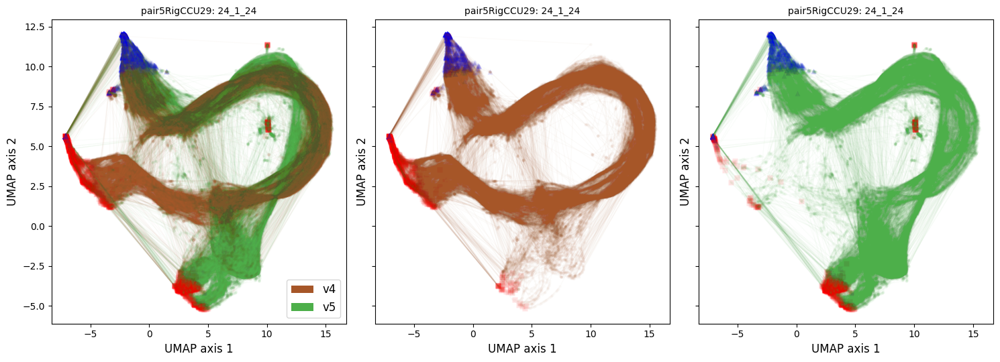

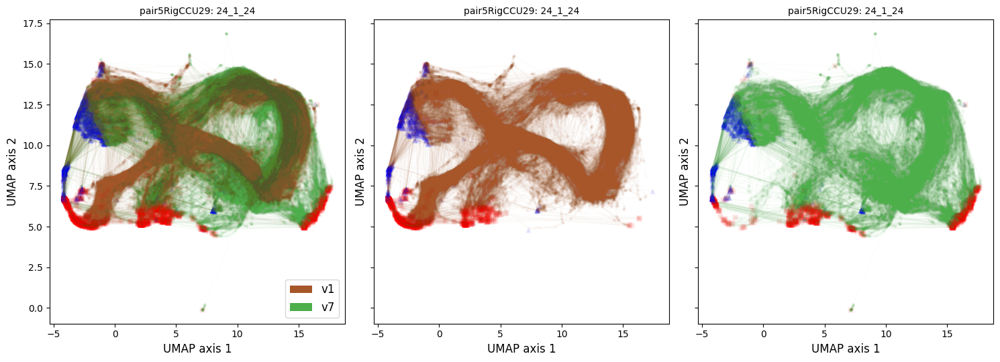

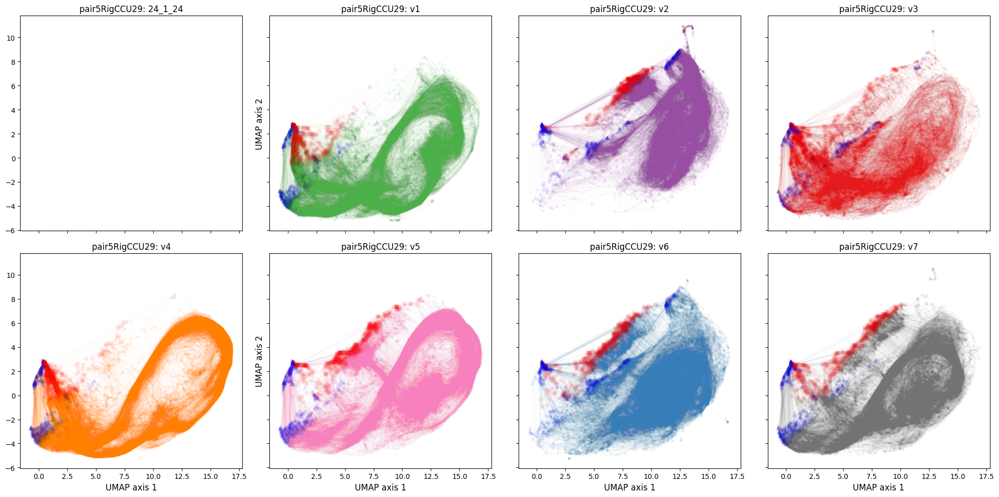

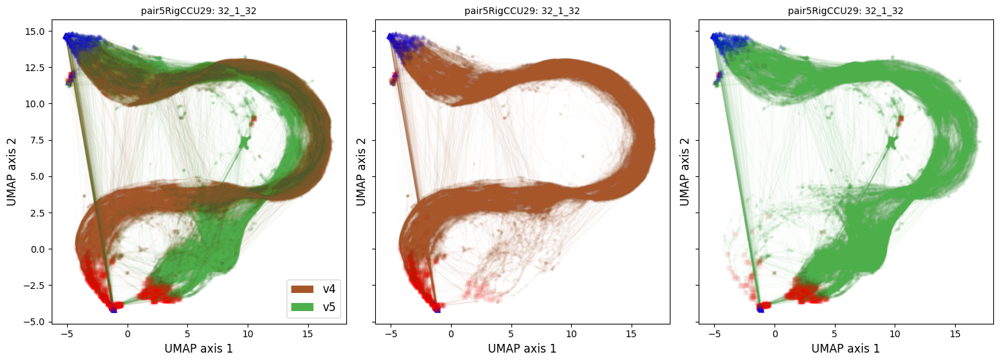

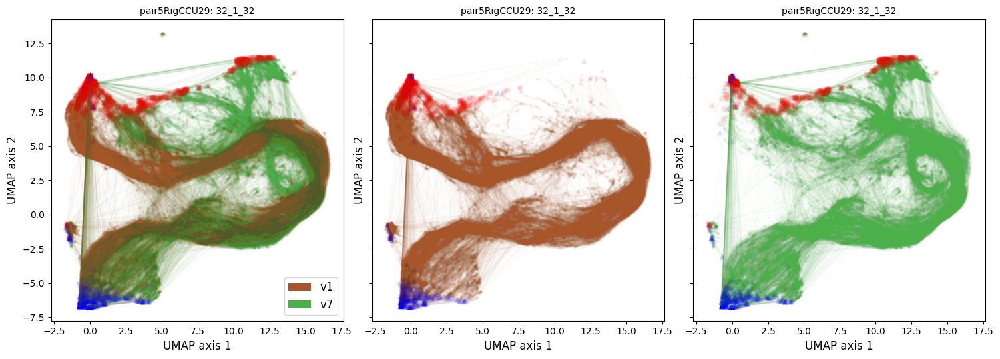

...

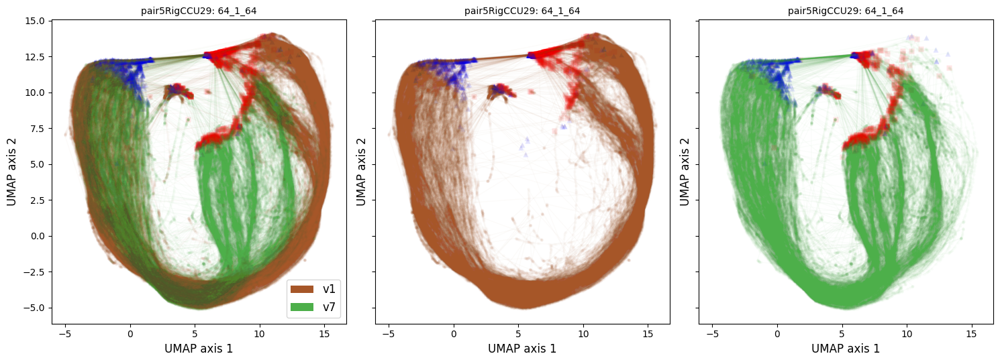

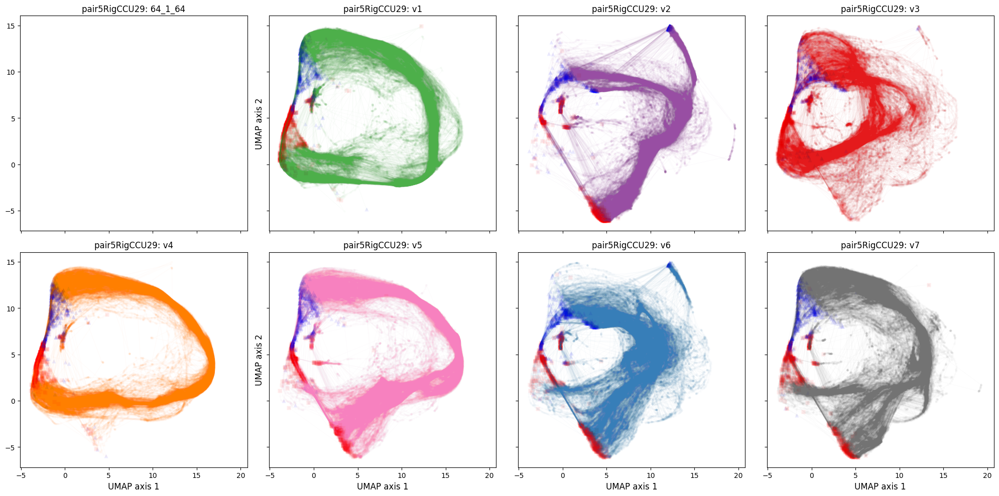

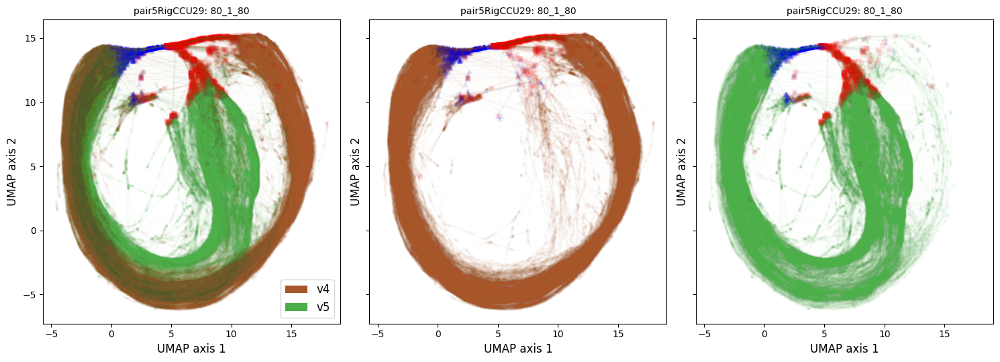

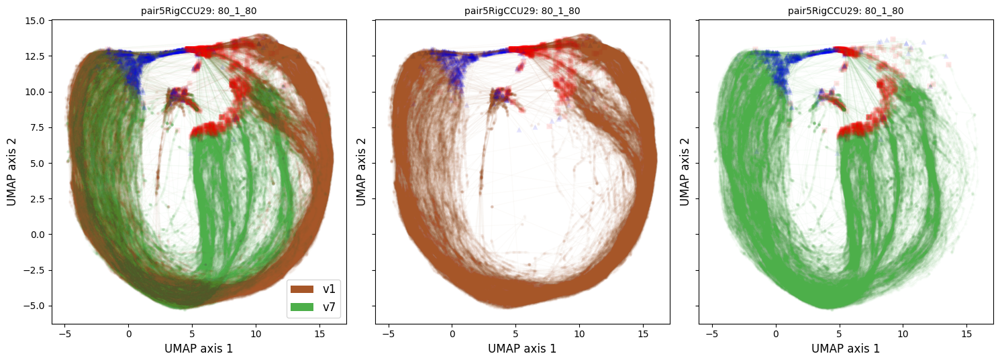

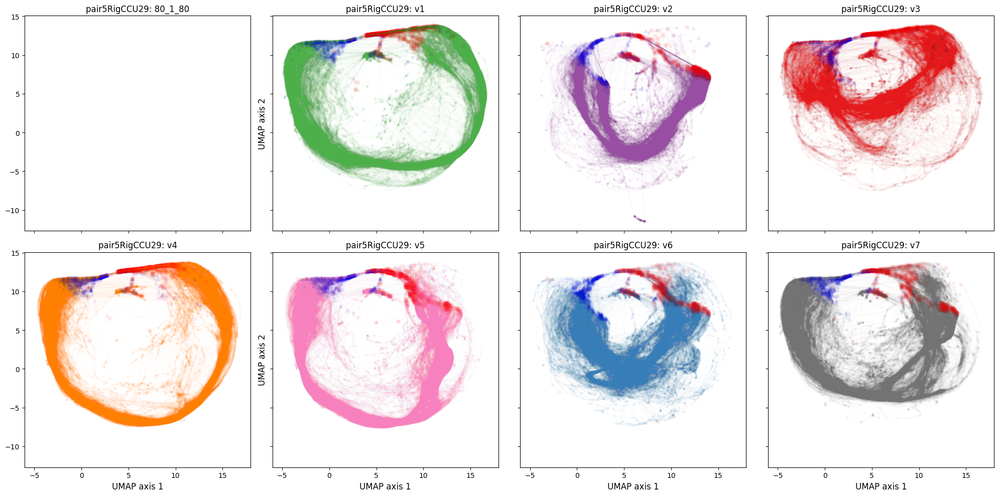

In [9]:
for wi in range(1, len(win_list)):
    w = win_list[wi]
    rn = f'{w}_1_{w}'
    vae_run = f'traj_chop_{rn}'
    fd_vae = os.path.join(fd_data, birdID, 'Traj', vae_suffix, vae_run)
    fd_latent = os.path.join(fd_latent_base, vae_run)
    fd_save = os.path.join(fd_save_base, vae_run)
    if not os.path.exists(fd_save):
        os.makedirs(fd_save)
    print(fd_save)

    ### read in all call embedding, thresholding based on hdbscan_prob, perform sampling if needed
    num_syl = 1000
    hdbscan_thre = 0.9
    # grab the latent data and info for each call subytpe
    fns_latent = sorted(glob.glob(os.path.join(fd_latent, 'latentM.v*.csv')))
    # read in all data
    latent_comb = np.empty((0, 32))
    info_comb = pd.DataFrame()
    for v in v_all:
        fn = sorted(glob.glob(os.path.join(fd_latent, f'latentM.{v}.csv')))[0]
        latent = np.loadtxt(fn, delimiter=',')
        fn_info = os.path.join(os.path.dirname(fn), f'info.{v}.csv')
        info = pd.read_csv(fn_info, index_col=0)

        # merge the syllable info to sliding window info
        merged_info = info.merge(info_syl, left_on='ri', right_on='index', how='left')

        #### sample data as UMAP inputs
        info_pass = merged_info[merged_info['hdbscan_prob']>=hdbscan_thre]
        if info_pass.empty:
            continue
        # get unique syllable id
        syl_uniq = sorted(list(set(info_pass['syl_id'])))
        # same syllables
        num_sample = min([num_syl, len(syl_uniq)])
        print(f'{v}: Total syllable {len(set(merged_info["syl_id"]))}. Pass threshold {len(syl_uniq)}. Sampled {num_sample}')
        random.seed(1118)
        syl_rd = random.sample(syl_uniq, num_sample)

        # get the latent data
        iwin = merged_info[merged_info['syl_id'].isin(syl_rd)].index
        info_rd = merged_info.iloc[iwin, :]
        latent_rd = latent[iwin, :]
        print(latent_rd.shape, info_rd.shape)

        latent_comb = np.vstack([latent_comb, latent_rd])
        info_comb = pd.concat([info_comb, info_rd], ignore_index=True)

    print(latent_comb.shape, info_comb.shape)

    ### paired UMAP
    for vp in v_pairs:
        idx_d = info_comb[info_comb['call_subtype'].isin(vp)].index
        latent_d = latent_comb[idx_d,:]
        info_d = info_comb.iloc[idx_d,:]
        print(latent_d.shape, info_d.shape)

        umap_model, embed = vae_goffinet.ZZ_runUMAP_v1(latent_d, param_umap, random_state=1118, meta_info=info_d)

        # save the embedding
        syl_str = ''.join(vp)
        fn_embed = os.path.join(fd_save, f'{birdID}.paired.{syl_str}.embedding.csv')
        embed.to_csv(fn_embed)
        print(fn_embed)

        # save the UMAP model for later usage
        fn_umap = os.path.join(fd_save, f'UMAPmodel_{birdID}.paired.{syl_str}.p')
        pickle.dump(umap_model, open(fn_umap, 'wb'))

        #### plot results, different color for different call subtypes
        col_full = ['#a65628','#4daf4a','#984ea3','#e41a1c','#ff7f00','#f781bf','#377eb8','#737373']
        col_dict = OrderedDict(zip(vp, col_full[0:len(vp)]))
        # get the syl id
        syl_comb = list(set(info_d['syl_id']))
        fig, axes = plt.subplots(nrows=1, ncols=3, figsize=[15, 5.5], sharex=True, sharey=True)
        for si in range(len(syl_comb)):
        # for si in range(100):
            ss = syl_comb[si]
            embed_s = embed[embed['syl_id']==ss]
            embed_s.index = range(embed_s.shape[0])
            x = np.array(embed_s['umap1'])
            y = np.array(embed_s['umap2'])
            v = embed_s['call_subtype'][0]
            vi = vp.index(v)
            # first  plot in overlaid
            ax = axes[0]
            ax.plot(x, y,  marker='o', linestyle='-', color=col_dict[v], markersize=3, linewidth=1, alpha=0.025, rasterized=True, markeredgecolor='none')
            # mark the start with triangle, and end with square
            ax.plot(x[0], y[0], marker='^', markersize=6, color='blue', alpha=0.1, rasterized=True, markeredgecolor='none')
            ax.plot(x[-1], y[-1], marker='s', markersize=6, color='red', alpha=0.1, rasterized=True, markeredgecolor='none')
            # then plot in separate
            ax = axes[vi+1]
            ax.plot(x, y,  marker='o', linestyle='-', color=col_dict[v], markersize=3, linewidth=1, alpha=0.025, rasterized=True, markeredgecolor='none')
            # mark the start with triangle, and end with square
            ax.plot(x[0], y[0], marker='^', markersize=6, color='blue', alpha=0.1, rasterized=True, markeredgecolor='none')
            ax.plot(x[-1], y[-1], marker='s', markersize=6, color='red', alpha=0.1, rasterized=True, markeredgecolor='none')
        # add legend
        legends = [Patch(facecolor=col_dict[name], label=name) for name in col_dict.keys()]
        ax = axes[0]
        ax.legend(handles=legends, loc='lower right', fontsize=12)
        # add xy axis labels
        for ai in range(len(axes)):
            ax = axes[ai]
            ax.set_title(f'{birdID}: {rn}', fontsize=10)
            ax.set_xlabel('UMAP axis 1', fontsize=12)
            ax.set_ylabel('UMAP axis 2', fontsize=12)
        plt.tight_layout()

        # save fig
        fn_fig = os.path.join(fd_save, f'{birdID}.paired.{syl_str}.embedding.pdf')
        fig.savefig(fn_fig, dpi=600)

    ### UMAP on all call subtypes
    vp = v_all
    idx_d = info_comb[info_comb['call_subtype'].isin(vp)].index
    latent_d = latent_comb[idx_d,:]
    info_d = info_comb.iloc[idx_d,:]
    print(latent_d.shape, info_d.shape)

    umap_model, embed = vae_goffinet.ZZ_runUMAP_v1(latent_d, param_umap, random_state=1118, meta_info=info_d)

    # save the embedding
    syl_str = ''.join(vp)
    fn_embed = os.path.join(fd_save, f'{birdID}.all.{syl_str}.embedding.csv')
    embed.to_csv(fn_embed)
    print(fn_embed)

    # save the UMAP model for later usage
    fn_umap = os.path.join(fd_save, f'UMAPmodel_{birdID}.all.{syl_str}.p')
    pickle.dump(umap_model, open(fn_umap, 'wb'))

    #### plot results, different color for different call subtypes in different panels 
    col_full = ['#a65628','#4daf4a','#984ea3','#e41a1c','#ff7f00','#f781bf','#377eb8','#737373']
    col_dict = OrderedDict(zip(vp, col_full[0:len(vp)]))
    # get the syl id
    syl_comb = list(set(info_d['syl_id']))
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=[20, 10], sharex=True, sharey=True)
    for si in range(len(syl_comb)):
    # for si in range(200):
        ss = syl_comb[si]
        embed_s = embed[embed['syl_id']==ss]
        embed_s.index = range(embed_s.shape[0])
        x = np.array(embed_s['umap1'])
        y = np.array(embed_s['umap2'])
        v = embed_s['call_subtype'][0]
        vi = vp.index(v)
        # first  plot in overlaid
        # ax = axes[0][0]
        # ax.plot(x, y,  marker='o', linestyle='-', color=col_dict[v], markersize=3, linewidth=1, alpha=0.005, rasterized=True, markeredgecolor='none')
        # # mark the start with triangle, and end with square
        # ax.plot(x[0], y[0], marker='^', markersize=6, color='blue', alpha=0.05, rasterized=True, markeredgecolor='none')
        # ax.plot(x[-1], y[-1], marker='s', markersize=6, color='red', alpha=0.05, rasterized=True, markeredgecolor='none')
        # then plot in separate
        plot_i = vi // 4
        plot_j = vi % 4
        ax = axes[plot_i][plot_j]
        ax.plot(x, y,  marker='o', linestyle='-', color=col_dict[v], markersize=3, linewidth=1, alpha=0.02, rasterized=True, markeredgecolor='none')
        # mark the start with triangle, and end with square
        ax.plot(x[0], y[0], marker='^', markersize=6, color='blue', alpha=0.075, rasterized=True, markeredgecolor='none')
        ax.plot(x[-1], y[-1], marker='s', markersize=6, color='red', alpha=0.075, rasterized=True, markeredgecolor='none')
    # add xy axis labels
    for plot_i in range(axes.shape[0]):
        for plot_j in range(axes.shape[1]):
            ax = axes[plot_i][plot_j]
            if plot_i==0 and plot_j==0:
                ax.set_title(f'{birdID}: {rn}', fontsize=12)
            else:
                ax.set_title(f'{birdID}: {vp[plot_i*4+plot_j]}', fontsize=12)
            if plot_i==1:
                ax.set_xlabel('UMAP axis 1', fontsize=12)
            if plot_j==1:
                ax.set_ylabel('UMAP axis 2', fontsize=12)
    plt.tight_layout()

    # save fig
    fn_fig = os.path.join(fd_save, f'{birdID}.paired.{syl_str}.embedding.pdf')
    fig.savefig(fn_fig, dpi=600)
    
    del latent_comb, info_comb, umap_model, latent_d, info_d, embed, syl_comb
    gc.collect()

In [44]:
len(syl_comb)

7000